<h1 align="center"> UNIVERSIDAD NACIONAL DE INGENIERIA</h1> 
<h1 align="center"> Inteligencia Artificial</h1> 
<h3 align="center"> Proyecto Final- Descubriendo las características importantes (Feature Selection)</h3> 
<h4 align="center">  Cristian Lazo : mecatronico.lazo@gmail.com</h4> 
<h4 align="center"> Frank Solis : so_ni_mf@hotmail.com   </h4> 
<h4 align="center"> Diego Quispe  : dquispec@uni.pe   </h4> 
<h4 align="center"> Docente    : Paul Antonio Cardenas Lizana</h4> 



   ### IMPORTAMOS LIBRERIAS

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn import metrics
import seaborn as sns
import gc
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

pd.set_option('display.max_columns', 100)

C:\Users\Diego\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


## Lectura de data y verificación de tamaño

In [2]:
# Leemos el archivo csv que contiene el dataset
train=pd.read_csv('../Dataset/Data_tratada_Train.csv',na_values=['NaN','nan',-1])
# Mostramos la cantidad de datos y el número de features
print('tamaño = ', train.shape)
# Presentamos un ejemplo (de 5 datos) del dataset
train.head()

tamaño =  (210000, 578)


,ID_CLIENTE,TARGET,N_DIAS_NAVEGACION_count,N_DIAS_NAVEGACION_mean,N_DIAS_NAVEGACION_max,N_DIAS_NAVEGACION_min,N_DIAS_NAVEGACION_sum,APP_1_count,APP_1_mean,APP_1_max,APP_1_min,APP_1_sum,APP_2_count,APP_2_mean,APP_2_max,APP_2_min,APP_2_sum,APP_3_count,APP_3_mean,APP_3_max,APP_3_min,APP_3_sum,APP_4_count,APP_4_mean,APP_4_max,APP_4_min,APP_4_sum,APP_5_count,APP_5_mean,APP_5_max,APP_5_min,APP_5_sum,APP_6_count,APP_6_mean,APP_6_max,APP_6_min,APP_6_sum,APP_7_count,APP_7_mean,APP_7_max,APP_7_min,APP_7_sum,APP_8_count,APP_8_mean,APP_8_max,APP_8_min,APP_8_sum,APP_9_count,APP_9_mean,APP_9_max,...,ANTIGUEDAD_LINEA_sum,ANTIGUEDAD_POSTPAGO_count,ANTIGUEDAD_POSTPAGO_mean,ANTIGUEDAD_POSTPAGO_max,ANTIGUEDAD_POSTPAGO_min,ANTIGUEDAD_POSTPAGO_sum,SUB_TOTAL_FACT_count,SUB_TOTAL_FACT_mean,SUB_TOTAL_FACT_max,SUB_TOTAL_FACT_min,SUB_TOTAL_FACT_sum,EDAD_count,EDAD_mean,EDAD_max,EDAD_min,EDAD_sum,DIAS_QUEDANPERMANENCIA_count,DIAS_QUEDANPERMANENCIA_mean,DIAS_QUEDANPERMANENCIA_max,DIAS_QUEDANPERMANENCIA_min,DIAS_QUEDANPERMANENCIA_sum,DEPARTAMENTO_count,DEPARTAMENTO_mean,DEPARTAMENTO_max,DEPARTAMENTO_min,DEPARTAMENTO_sum,alta_SEGMENTOGRUPOCLIENTEDESC_mean,media_SEGMENTOGRUPOCLIENTEDESC_mean,baja_SEGMENTOGRUPOCLIENTEDESC_mean,alta_VALORRENTAMENSUAL_mean,media_VALORRENTAMENSUAL_mean,baja_VALORRENTAMENSUAL_mean,alta_ANTIGUEDAD_LINEA_mean,media_ANTIGUEDAD_LINEA_mean,baja_ANTIGUEDAD_LINEA_mean,alta_ANTIGUEDAD_POSTPAGO_mean,media_ANTIGUEDAD_POSTPAGO_mean,baja_ANTIGUEDAD_POSTPAGO_mean,alta_SUB_TOTAL_FACT_mean,media_SUB_TOTAL_FACT_mean,baja_SUB_TOTAL_FACT_mean,alta_EDAD_mean,media_EDAD_mean,baja_EDAD_mean,alta_DIAS_QUEDANPERMANENCIA_mean,media_DIAS_QUEDANPERMANENCIA_mean,baja_DIAS_QUEDANPERMANENCIA_mean,alta_DEPARTAMENTO_mean,media_DEPARTAMENTO_mean,baja_DEPARTAMENTO_mean
0,M4+Yb9VBZlrmolusfk43+6zj9IEiONcbxv8Vo4mDskU=,0,2.0,22.500000,24.0,21.0,45.0,2.0,1720.460000,1920.41,1520.51,3440.92,2.0,126.150000,199.79,52.51,252.30,2.0,30.050000,38.50,21.60,60.10,2.0,102.020000,202.02,2.02,204.04,2.0,8.64,11.58,5.70,17.28,2.0,0.000000,0.00,0.0,0.00,2.0,0.000000,0.00,0.0,0.00,2.0,0.000000,0.00,0.0,0.00,2.0,0.055000,0.11,...,216.0,3,46.000000,47.0,45.0,138.0,3,27.209900,38.4097,18.6400,81.6297,3,40.000000,40.000000,40.0,120.000000,3,187.725141,187.725141,187.725141,563.175424,3,6.666667,8,4,20,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,7CZN3fc0TkgCt99e2wXhHws0ZdjbidJ13wHbBCWo93s=,0,3.0,29.666667,31.0,28.0,89.0,3.0,372.153333,517.42,243.49,1116.46,3.0,213.943333,364.16,1.24,641.83,3.0,204.206667,227.78,163.11,612.62,3.0,259.273333,310.07,189.59,777.82,3.0,292.36,349.30,183.02,877.08,3.0,0.133333,0.40,0.0,0.40,3.0,0.000000,0.00,0.0,0.00,3.0,0.006667,0.02,0.0,0.02,3.0,0.656667,1.39,...,261.0,3,87.000000,88.0,86.0,261.0,3,57.903333,63.5500,55.0800,173.7100,3,39.495382,45.743074,27.0,118.486147,3,187.725141,187.725141,187.725141,563.175424,3,9.000000,9,9,27,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,Gato2h7aHbSHatI1jDDmHEgQsm+L0kVqt59jfZLp6vQ=,0,3.0,30.000000,31.0,28.0,90.0,3.0,257.596667,427.18,114.17,772.79,3.0,22.106667,53.11,0.73,66.32,3.0,15.536667,16.13,15.01,46.61,3.0,272.520000,339.50,182.71,817.56,3.0,26.80,80.35,0.02,80.40,3.0,0.000000,0.00,0.0,0.00,3.0,0.000000,0.00,0.0,0.00,3.0,0.000000,0.00,0.0,0.00,3.0,0.110000,0.33,...,505.0,3,168.333333,169.0,167.0,505.0,3,105.460000,121.4600,97.4600,316.3800,3,80.000000,80.000000,80.0,240.000000,3,-95.000000,-66.000000,-125.000000,-285.000000,3,14.000000,14,14,42,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,a7ydviDHC4D3hefkfTJF9UP3sIJ55tM+Y7OW40bIlKc=,0,3.0,28.000000,31.0,26.0,84.0,3.0,781.600000,1042.77,553.30,2344.80,3.0,155.863333,465.97,0.46,467.59,3.0,1691.943333,3094.74,42.64,5075.83,3.0,28.873333,69.08,0.01,86.62,3.0,25.58,58.53,7.34,76.74,3.0,38.846667,72.64,9.4,116.54,3.0,0.000000,0.00,0.0,0.00,3.0,0.000000,0.00,0.0,0.00,3.0,0.000000,0.00,...,174.0,3,58.000000,5

In [3]:
elim=0       # Contador de columnas (features) eliminadas
cols=[]      # Vector de columnas (sus nombres) eliminadas
# Procedemos a eliminar columnas irrelevantes
for col in train.columns:   
    if train[col].nunique()<=1:              # Verificamos si alguna columna tiene datos repetidos
        train.drop(col,axis=1,inplace=True)  # Retiramos la columna inncesaria
        cols.append(col)    # Agregamos el nombre de la columna eliminada al vector
        elim+=1        # Si se elimino alguna columna, se aumenta el contador en 1
print('Han sido eliminadas '+str(elim)+' columnas irrelevantes: '+str(cols))

Han sido eliminadas 47 columnas irrelevantes: ['alta_N_DIAS_NAVEGACION_mean', 'baja_APP_1_mean', 'baja_APP_2_mean', 'baja_APP_3_mean', 'baja_APP_4_mean', 'baja_APP_5_mean', 'baja_APP_6_mean', 'baja_APP_7_mean', 'baja_APP_8_mean', 'baja_APP_9_mean', 'baja_APP_10_mean', 'baja_MB_TOTAL_APP_mean', 'baja_CANT_CONSULTAS_PREV_mean', 'baja_TRAF_DATOS_2G_mean', 'baja_TRAF_DATOS_3G_mean', 'baja_TRAF_DATOS_4G_mean', 'baja_TRAF_DATOS_mean', 'baja_TRAF_DATOS_3G_CON_COBERTURA_4G_mean', 'baja_TRAF_DATOS_3G_SIN_COBERTURA_4G_mean', 'baja_INDICADOR_DATOS_1_mean', 'baja_INDICADOR_DATOS_2_mean', 'alta_TOUCHSCREEN_mean', 'alta_TECLADO_mean', 'baja_SISTEMA_mean', 'alta_TEC_CHIP_mean', 'alta_TEC_EQUIPO_mean', 'alta_WIFI_mean', 'baja_AIRTIME_IN_TOT_mean', 'baja_AIRTIME_IN_ON_mean', 'baja_AIRTIME_IN_OFF_mean', 'baja_CALLS_IN_OFF_mean', 'baja_AIRTIME_OUT_TOT_mean', 'baja_AIRTIME_OUT_ON_mean', 'baja_AIRTIME_OUT_OFF_mean', 'baja_CONT_TOT_mean', 'baja_CONT_ON_mean', 'baja_CONT_OFF_mean', 'SEGMENTOGRUPOCLIENTEDESC_

In [4]:
# Visualizamos el tipo de datos que se tienen en los features
train.dtypes

ID_CLIENTE                              object
TARGET                                   int64
N_DIAS_NAVEGACION_count                float64
N_DIAS_NAVEGACION_mean                 float64
N_DIAS_NAVEGACION_max                  float64
N_DIAS_NAVEGACION_min                  float64
N_DIAS_NAVEGACION_sum                  float64
APP_1_count                            float64
APP_1_mean                             float64
APP_1_max                              float64
APP_1_min                              float64
APP_1_sum                              float64
APP_2_count                            float64
APP_2_mean                             float64
APP_2_max                              float64
APP_2_min                              float64
APP_2_sum                              float64
APP_3_count                            float64
APP_3_mean                             float64
APP_3_max                              float64
APP_3_min                              float64
APP_3_sum    

### Primero grafÍcamos la correlación entre todos los datos

In [5]:
str_list = []
for colname, colvalue in train.iteritems():
    if type(colvalue[1]) == str:
         str_list.append(colname)
str_list.append('TARGET')
print (str_list)

['ID_CLIENTE', 'TARGET']


In [6]:
num_list = train.columns.difference(str_list) 
print (num_list)

Index(['AIRTIME_IN_OFF_count', 'AIRTIME_IN_OFF_max', 'AIRTIME_IN_OFF_mean',
       'AIRTIME_IN_OFF_min', 'AIRTIME_IN_OFF_sum', 'AIRTIME_IN_ON_count',
       'AIRTIME_IN_ON_max', 'AIRTIME_IN_ON_mean', 'AIRTIME_IN_ON_min',
       'AIRTIME_IN_ON_sum',
       ...
       'media_TOP_CONT_ON_5_mean', 'media_TOUCHSCREEN_mean',
       'media_TRAF_DATOS_2G_mean', 'media_TRAF_DATOS_3G_CON_COBERTURA_4G_mean',
       'media_TRAF_DATOS_3G_SIN_COBERTURA_4G_mean', 'media_TRAF_DATOS_3G_mean',
       'media_TRAF_DATOS_4G_mean', 'media_TRAF_DATOS_mean',
       'media_VALORRENTAMENSUAL_mean', 'media_WIFI_mean'],
      dtype='object', length=529)


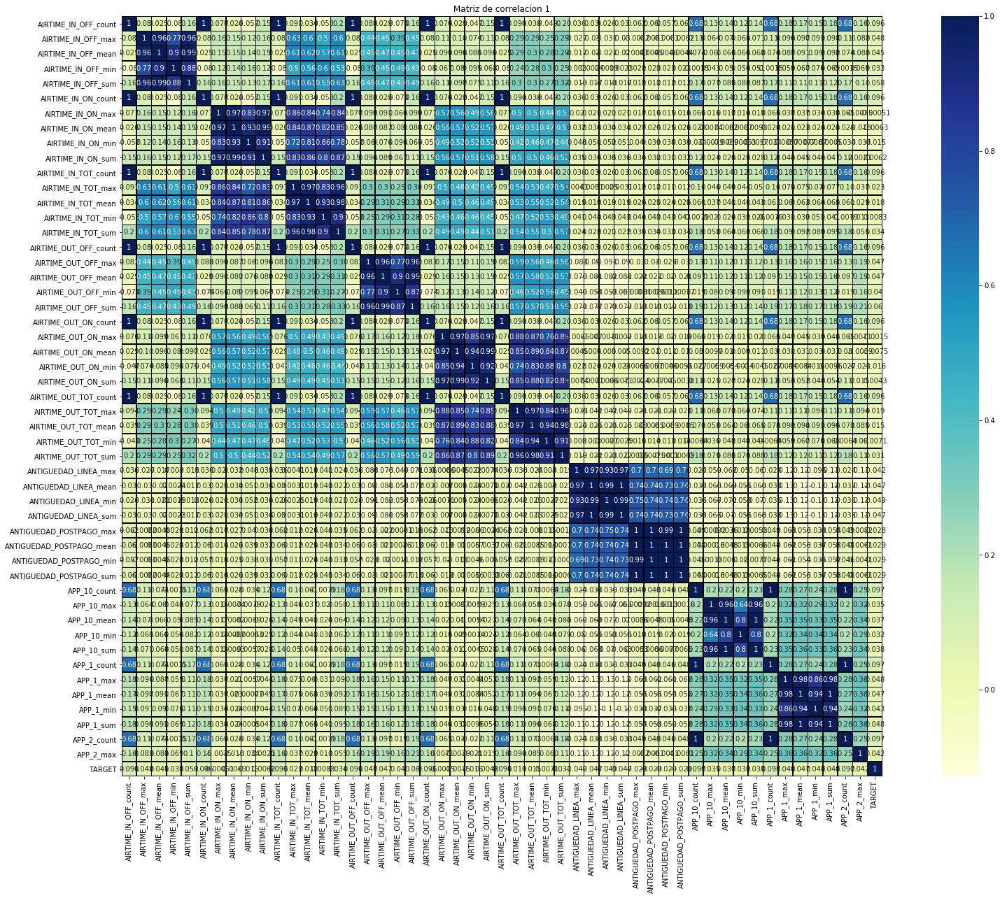

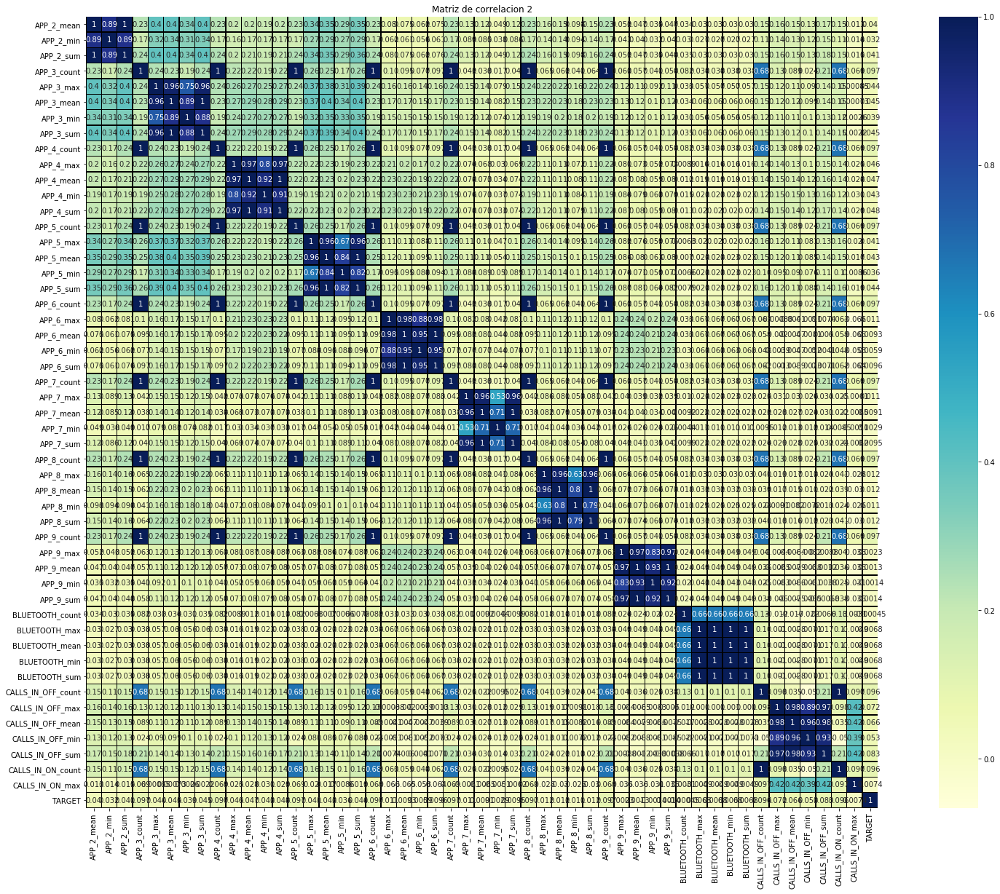

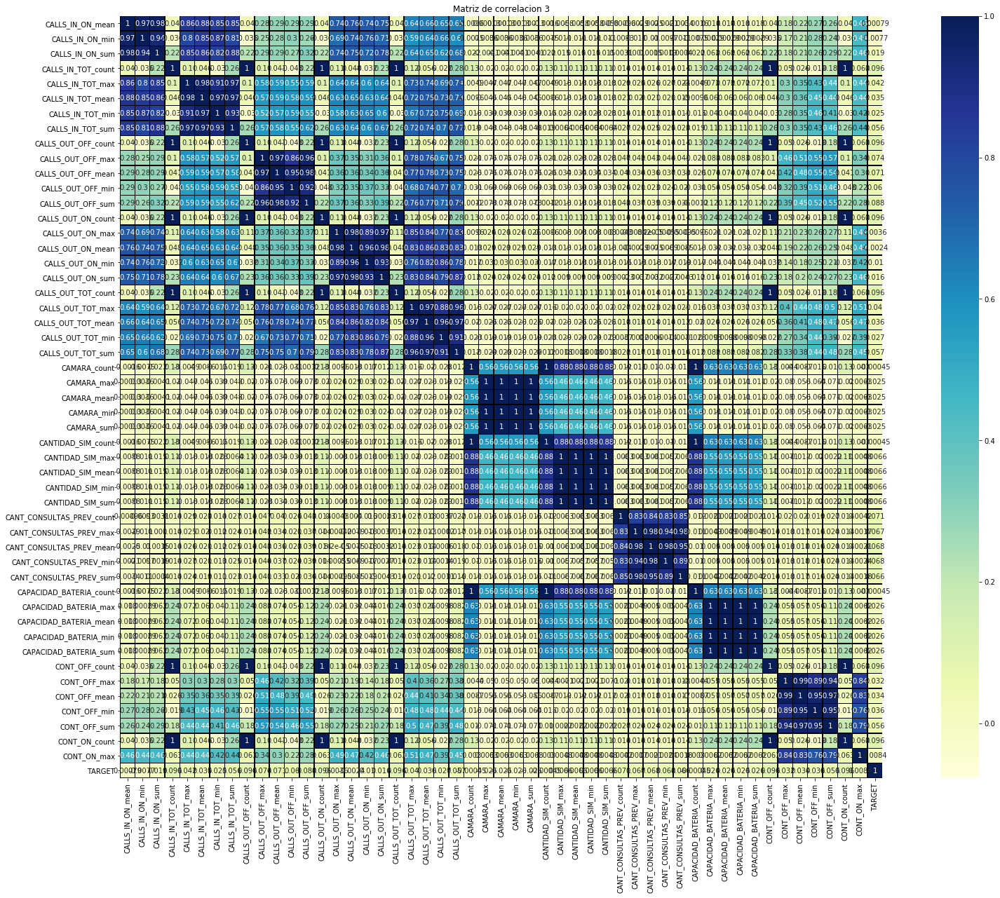

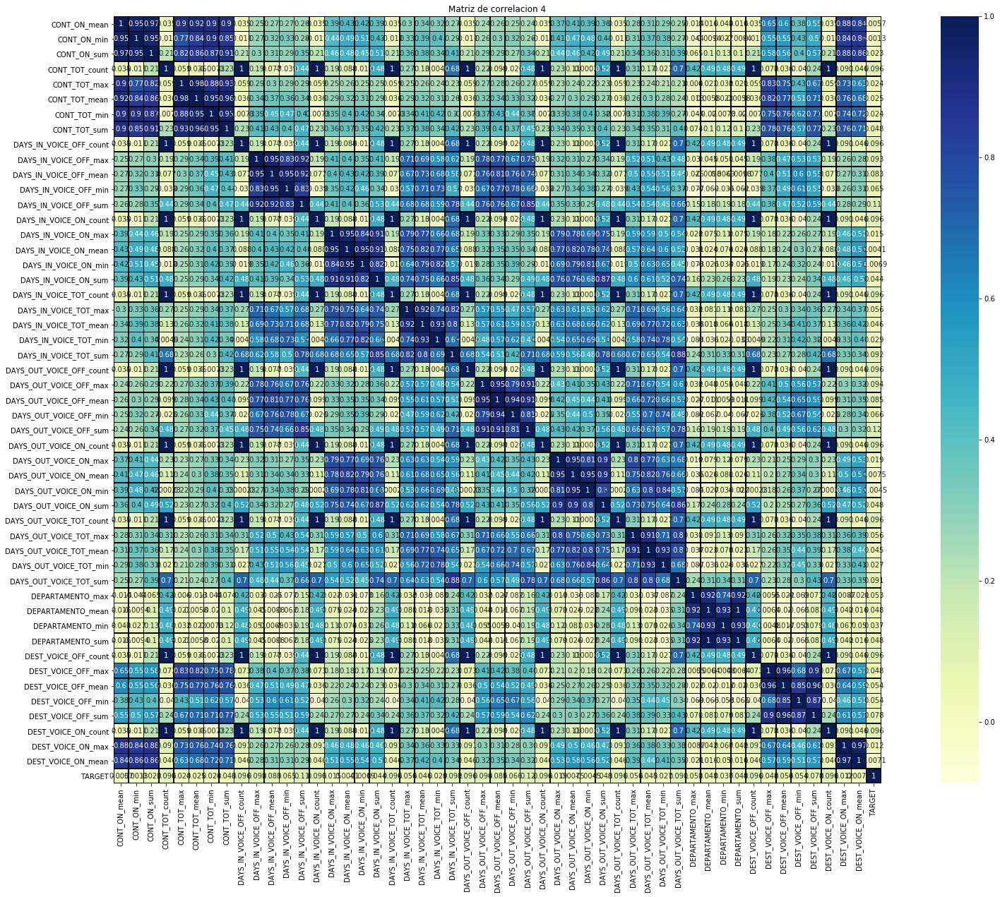

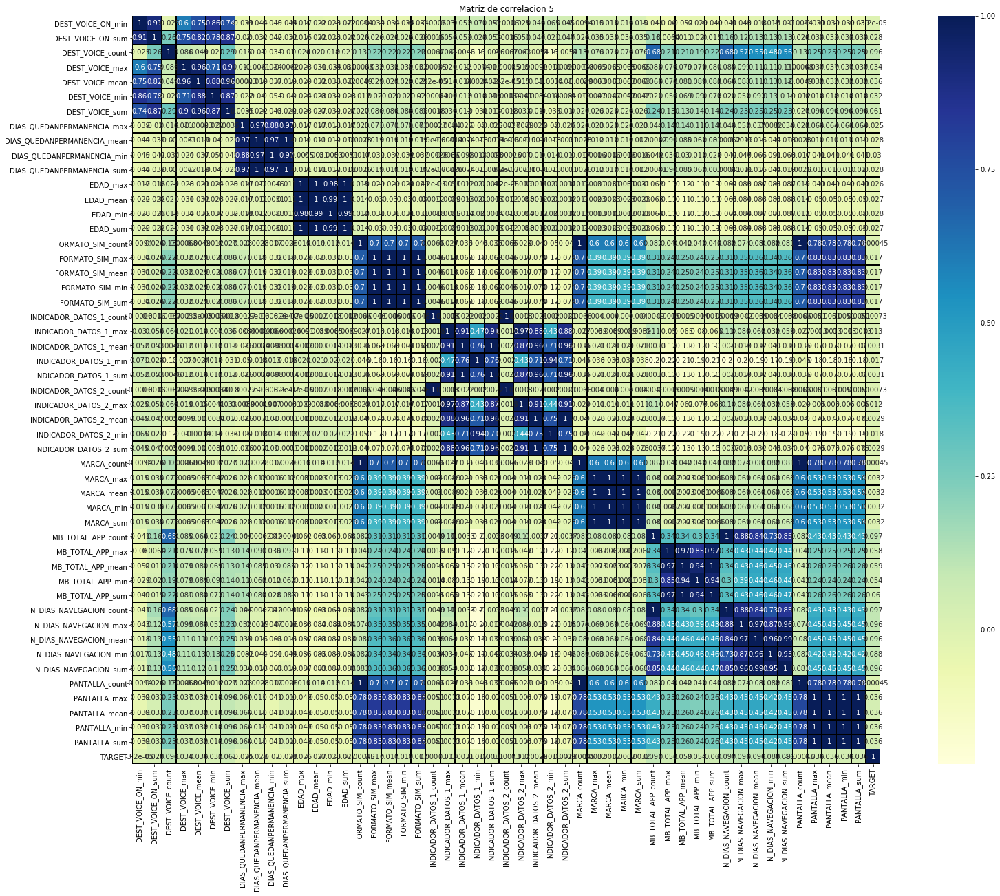

...

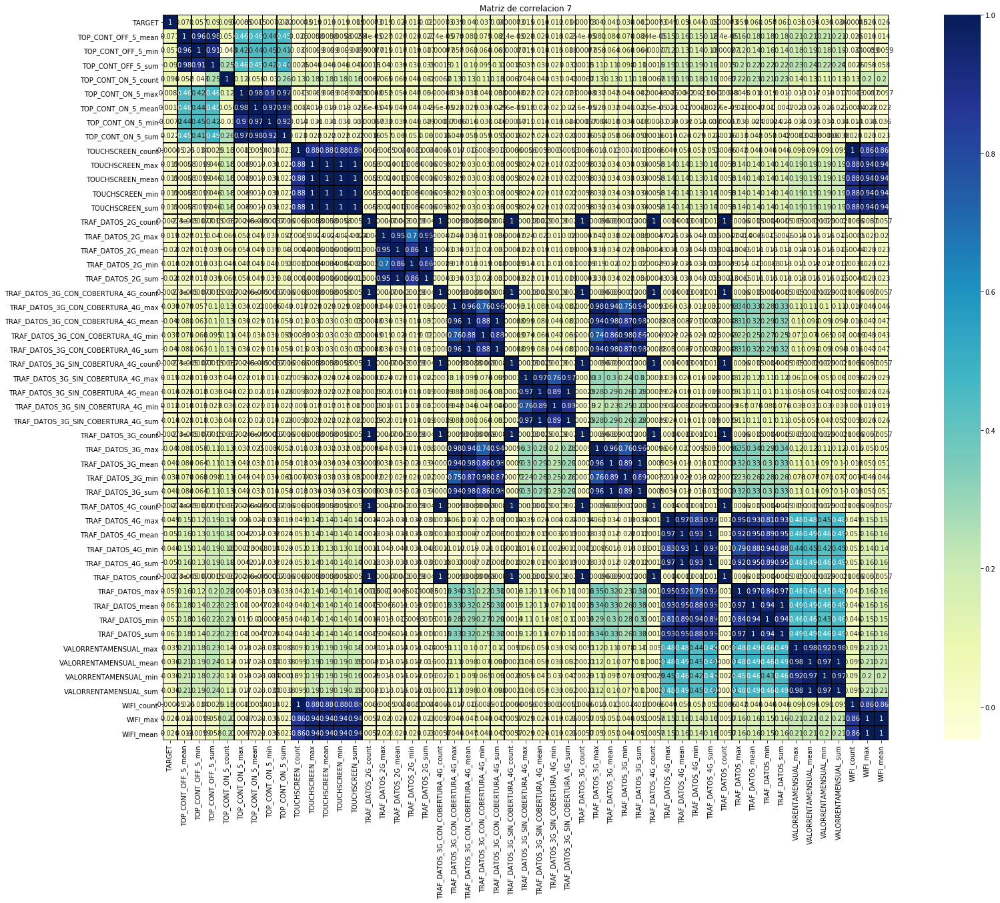

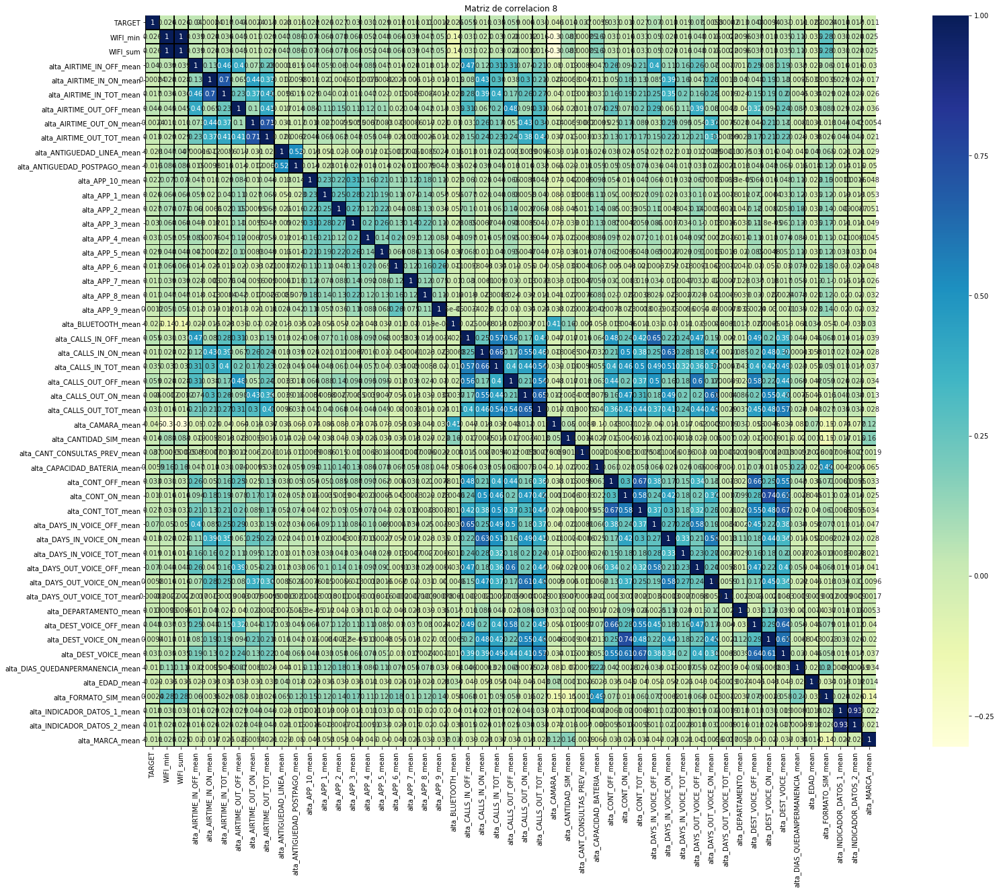

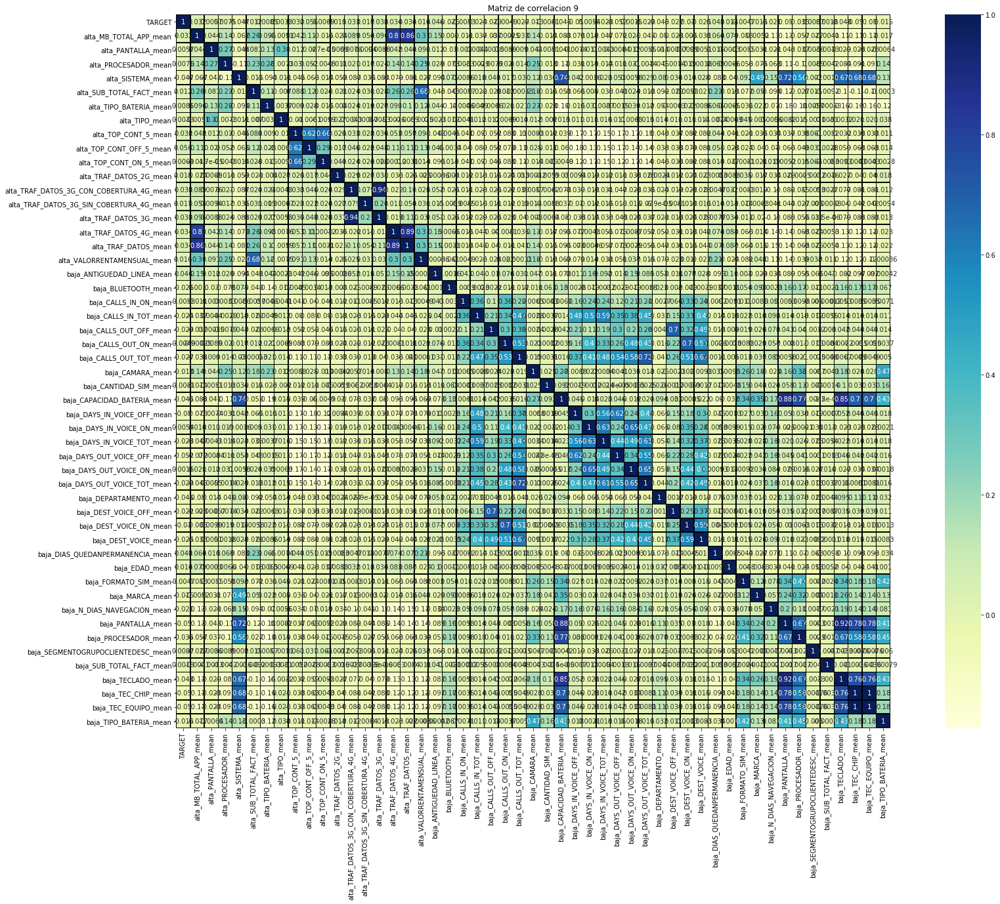

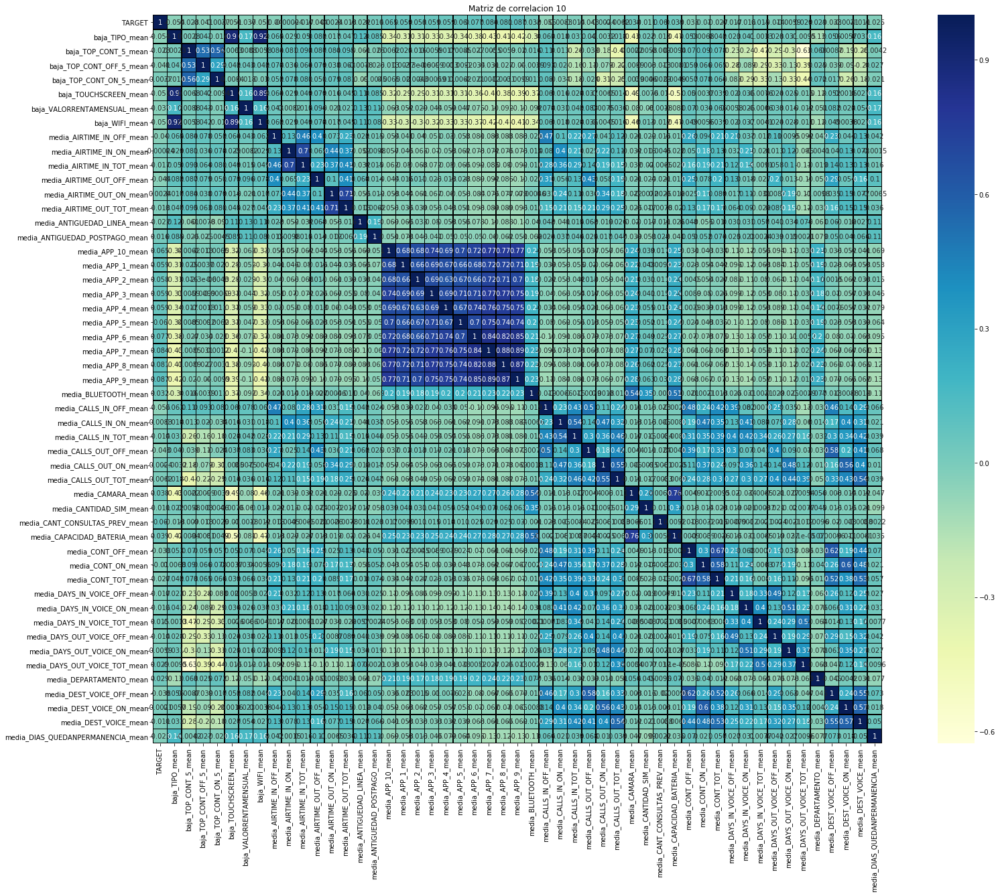

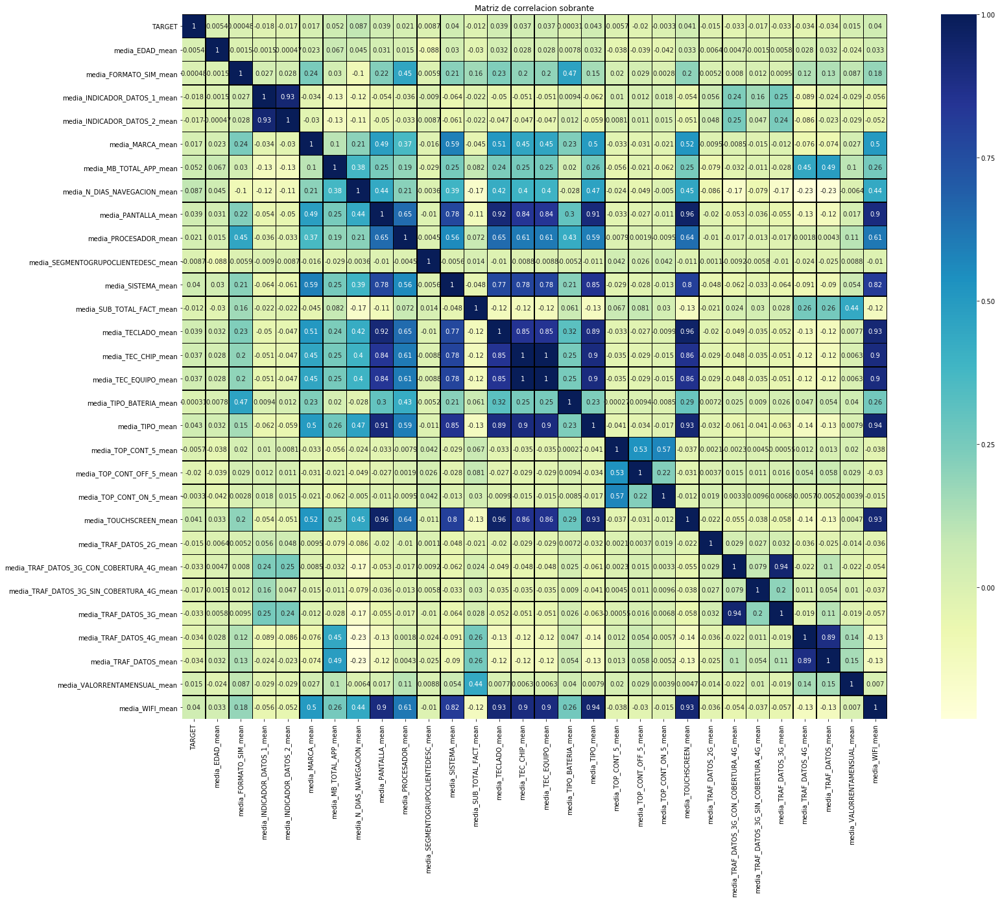

In [7]:
tam_submat = 50                                 # tamaño de los grupos de caracteristicas
num_plots = int(num_list.shape[0]/tam_submat)   # número de grupos de 50 características
num_plots_rest = num_list.shape[0]%tam_submat   # grupo de características con el resto
 
# Graficamos las correlaciones en una tabla
for i in range(num_plots):
    index = pd.Index(['TARGET'])   # En todo gráfico se requiere el "TARGET"                                
    index = index.union(num_list[tam_submat*i:tam_submat*i+tam_submat])   # Agregamos el target al grupo de momento
    dfnum = train[index]           # Obtenemos los datos del grupo de caracteristiccas
    f, ax = plt.subplots(figsize=(30, 20))     # Tamaño de gráfico   
    plt.title('Matriz de correlacion ' + str(i+1))      # Título
    # Se calculan las correlaciones y se ubican en la tabla
    sns.heatmap(dfnum.astype(float).corr(),linewidths=0.5,vmax=1.0, square=True, cmap="YlGnBu", linecolor='black', annot=True)
    
    # Rehacemos lo mismo para el resto de valores
if (num_plots_rest > 0):
    index = pd.Index(['TARGET'])
    index = index.union(num_list[num_plots*tam_submat:num_plots*tam_submat + num_plots_rest]) 
    dfnum = train[index]
    f, ax = plt.subplots(figsize=(30, 20))
    plt.title('Matriz de correlacion sobrante')
    sns.heatmap(dfnum.astype(float).corr(),linewidths=0.5, vmax=1.0, square=True, cmap="YlGnBu", linecolor='black', annot=True)
    

### Para reducir las características, seleccionamos las 5 con mejor correlación

In [8]:
num_max = 5
list_max =pd.Index(['TARGET'])
for i in range(num_plots):
    index = pd.Index(['TARGET'])
    index = index.union(num_list[tam_submat*i:tam_submat*i+tam_submat]) 
    dfnum = train[index]
    mat_corr = dfnum.astype(float).corr().abs()
    # doblemente referenciado
    vect_corr = mat_corr[['TARGET']].sort_values(by = ['TARGET'], ascending = False)
    list_max = list_max.union(vect_corr.axes[0][1:num_max+1]) 
    
if (num_plots_rest > 0):
    index = pd.Index(['TARGET'])
    index = index.union(num_list[num_plots*tam_submat:num_plots*tam_submat + num_plots_rest]) 
    dfnum = train[index]
    mat_corr = dfnum.astype(float).corr().abs()
    vect_corr = mat_corr[['TARGET']].sort_values(by = ['TARGET'], ascending = False)
    list_max = list_max.union(vect_corr.axes[0][1:2]) 

### Características escogidas

In [9]:
list_max  # Mostramos los features con mejor correlacion con el "target"

Index(['AIRTIME_IN_TOT_count', 'AIRTIME_OUT_ON_count', 'APP_10_count',
       'APP_1_count', 'APP_2_count', 'APP_4_count', 'APP_5_count',
       'APP_6_count', 'APP_7_count', 'APP_8_count', 'CALLS_IN_TOT_count',
       'CALLS_OUT_ON_count', 'CALLS_OUT_TOT_count', 'CONT_OFF_count',
       'CONT_ON_count', 'CONT_TOT_count', 'DAYS_IN_VOICE_OFF_sum',
       'DAYS_IN_VOICE_TOT_count', 'DAYS_OUT_VOICE_OFF_sum',
       'DEST_VOICE_ON_count', 'DEST_VOICE_count', 'MB_TOTAL_APP_count',
       'N_DIAS_NAVEGACION_count', 'N_DIAS_NAVEGACION_max',
       'N_DIAS_NAVEGACION_sum', 'TARGET', 'TOP_CONT_5_count', 'TOP_CONT_5_max',
       'TOP_CONT_5_sum', 'TOP_CONT_OFF_5_count', 'TOP_CONT_OFF_5_max',
       'TOP_CONT_OFF_5_mean', 'TOP_CONT_OFF_5_sum', 'TOP_CONT_ON_5_count',
       'TRAF_DATOS_mean', 'TRAF_DATOS_sum', 'alta_CALLS_IN_OFF_mean',
       'alta_CALLS_OUT_OFF_mean', 'alta_DAYS_IN_VOICE_OFF_mean',
       'alta_DAYS_OUT_VOICE_OFF_mean', 'alta_DEST_VOICE_OFF_mean',
       'alta_TOP_CONT_OFF_5_mean

## Reducimos los "features" del dataset

In [10]:
index = pd.Index(['TARGET'])   # En todo gráfico se requiere el "TARGET"                                
index = index.union(list_max)   # Agregamos el target al grupo de momento
train2= train[index]

In [11]:
y = train2['TARGET']
x = train2.drop('TARGET', axis=1)

### Mostramos las correlaciones, en una tabla, de los valores más importantes

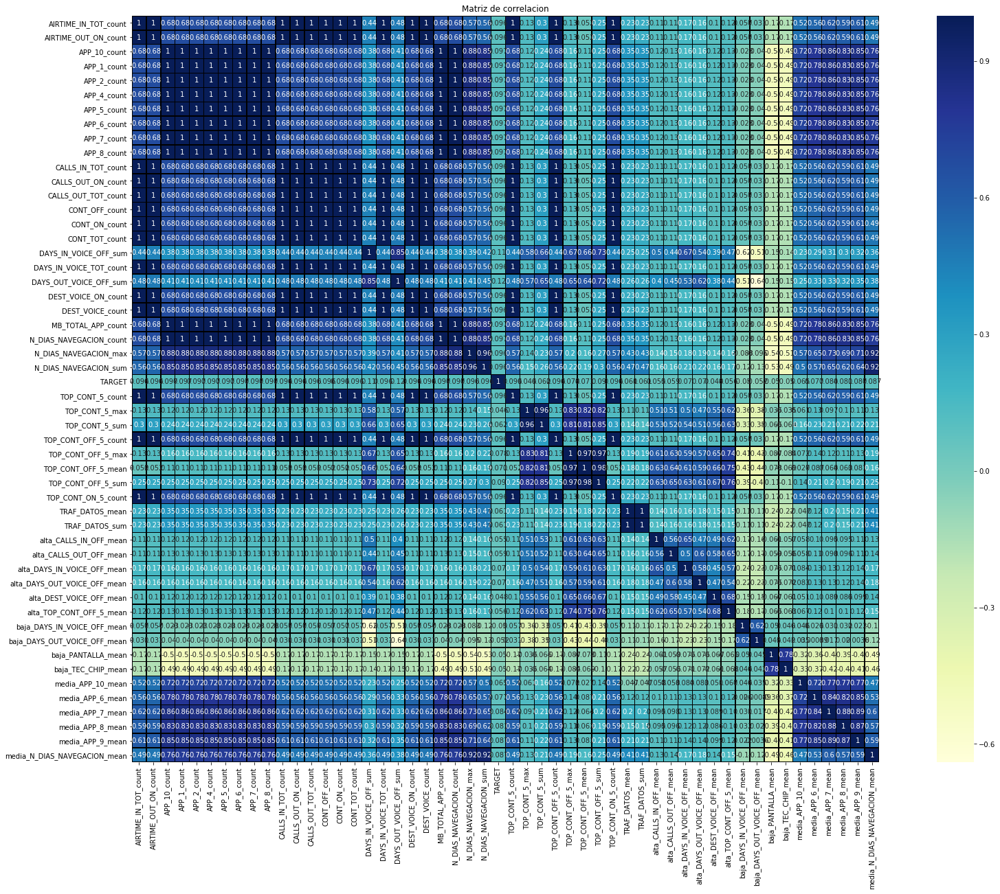

In [12]:
str_list = []
for colname, colvalue in train.iteritems():
    if type(colvalue[1]) == str:
         str_list.append(colname)
num_list = train2.columns.difference(str_list) 
train_num = train2[num_list]
f, ax = plt.subplots(figsize=(30, 20))
plt.title('Matriz de correlacion')
sns.heatmap(train_num.astype(float).corr(),linewidths=0.5, vmax=1.0, square=True, cmap="YlGnBu", linecolor='black', annot=True)

## División de la data para entrenamiento y test (Ejemplo de división)


In [17]:
from sklearn.model_selection import train_test_split
# Con esto, seleccionamos un 70% de la cantidad de dataset para entrenar. El 30% restante para evaluar la precisión del taining
X_train, X_val, y_train, y_val = train_test_split(x, y, test_size=0.3, random_state=42)
print(f'Train shape     : {X_train.shape}')
print(f'Validation shape: {X_val.shape}')

Train shape     : (147000, 51)
Validation shape: (63000, 51)


## Entrenando con Linear Regression

In [18]:
from sklearn.linear_model import LinearRegression

reg=LinearRegression()
reg.fit(X_train, y_train)
reg.score(X_train,y_train)

0.01972849633858731

In [ ]:
# Se obseva un bajo nivel de correlacion

## Entrenando con Random Forest Regresor

In [21]:
from sklearn.ensemble import RandomForestClassifier
model_rf = RandomForestClassifier(500, n_jobs=-1,oob_score=True,min_samples_split=10,warm_start=True)
model_rf.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=True)

In [24]:
y_train_pred = model_rf.predict(X_train)
y_val_pred = model_rf.predict(X_val)

In [28]:
from sklearn.metrics import roc_auc_score
print("Accuracy Random Forest Regresor:",metrics.accuracy_score(y_train, y_train_pred))
print("Accuracy Random Forest Regresor:",metrics.accuracy_score(y_val, y_val_pred))

print("AUC TRAIN:", roc_auc_score(y_train, y_train_pred))
print("AUC TEST:", roc_auc_score(y_val, y_val_pred))


Accuracy Random Forest Regresor: 0.9019319727891156
Accuracy Random Forest Regresor: 0.9008095238095238
AUC TRAIN: 0.5113551623618737
AUC TEST: 0.5


# Interpretación del modelo

## Feature importance

In [30]:
#print(model.feature_importances_)
imp = pd.DataFrame({'cols':X_train.columns, 'imp':model_rf.feature_importances_}).sort_values('imp', ascending=False)
imp.style.bar()

,cols,imp
33,TRAF_DATOS_mean,0.129557
34,TRAF_DATOS_sum,0.128923
27,TOP_CONT_5_sum,0.0981275
16,DAYS_IN_VOICE_OFF_sum,0.0976055
18,DAYS_OUT_VOICE_OFF_sum,0.0941689
24,N_DIAS_NAVEGACION_sum,0.0776075
26,TOP_CONT_5_max,0.0763445
31,TOP_CONT_OFF_5_sum,0.0589876
30,TOP_CONT_OFF_5_mean,0.056874
29,TOP_CONT_OFF_5_max,0.0528586


In [31]:
# Seleccionamos las 5 características mas importantes
num_most_important_features = 5
index_most_important_feautres = pd.Index(imp['cols'][0:num_most_important_features])
print(index_most_important_feautres)

Index(['TRAF_DATOS_mean', 'TRAF_DATOS_sum', 'TOP_CONT_5_sum',
       'DAYS_IN_VOICE_OFF_sum', 'DAYS_OUT_VOICE_OFF_sum'],
      dtype='object', name='cols')


## Con la data tratada, hacemos un entrenamiento de SVM

In [33]:
# De las 5 más importantes, realizamos un SVM
x_train_svm =  X_train[index_most_important_feautres]
x_val_svm = X_val[index_most_important_feautres]

In [34]:
from sklearn.svm import SVC
model_svm = SVC(gamma='auto')
model_svm.fit(x_train_svm[0:4000], y_train[0:4000]) 

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [41]:
y_train_pred = model_svm.predict(x_train_svm[0:4000])
y_val_pred = model_svm.predict(x_val_svm[0:300])

In [42]:
print("Accuracy Training Support Vector Machines:",metrics.accuracy_score(y_train[0:4000], y_train_pred))
print("Accuracy Validation Support Vector Machines:",metrics.accuracy_score(y_val[0:300], y_val_pred))

print("AUC TRAIN:", roc_auc_score(y_train[0:4000], y_train_pred))
print("AUC TEST:", roc_auc_score(y_val[0:300], y_val_pred))

Accuracy Training Support Vector Machines: 0.9985
Accuracy Validation Support Vector Machines: 0.9133333333333333
AUC TRAIN: 0.9927710843373494
AUC TEST: 0.5


### Ahora un entrenamiento Gaussian Naive Bayes

In [43]:
from sklearn.naive_bayes import GaussianNB
model_gnb = GaussianNB()
model_gnb.fit(X_train, y_train)
y_train_pred = model_gnb.predict(X_train)
y_val_pred = model_gnb.predict(X_val)

In [44]:
print("Accuracy Training Gaussian Naive Bayes:",metrics.accuracy_score(y_train, y_train_pred))
print("Accuracy Validation Gaussian Naive Bayes:",metrics.accuracy_score(y_val, y_val_pred))

print("AUC TRAIN:", roc_auc_score(y_train, y_train_pred))
print("AUC TEST:", roc_auc_score(y_val, y_val_pred))

Accuracy Training Gaussian Naive Bayes: 0.29431972789115646
Accuracy Validation Gaussian Naive Bayes: 0.29647619047619045
AUC TRAIN: 0.5649502026419607
AUC TEST: 0.5676376761805386


### Entrenamos con Logistic Regression

In [46]:
from sklearn.linear_model import LogisticRegression
model_logistic = LogisticRegression(random_state=0, solver='lbfgs')
model_logistic.fit(X_train, y_train)
y_train_pred = model_logistic.predict(X_train)
y_val_pred = model_logistic.predict(X_val)

In [47]:
print("Accuracy Training Logistic Regression Training Data:",metrics.accuracy_score(y_train, y_train_pred))
print("Accuracy Validation Logistic Regression Validación Data:",metrics.accuracy_score(y_val, y_val_pred))

print("AUC TRAIN:", roc_auc_score(y_train, y_train_pred))
print("AUC TEST:", roc_auc_score(y_val, y_val_pred))

Accuracy Training Logistic Regression Training Data: 0.8996462585034014
Accuracy Validation Logistic Regression Validación Data: 0.9008095238095238
AUC TRAIN: 0.49999621925307564
AUC TEST: 0.5


# CONCLUSIONES

 - De los modelos explicados en clase: Linear Regression resulta ser el más impreciso e ineficaz
 - De los modelos explicados en clase: SVM y Random Forest Regresor resultan ser los más confiables
 - De los modelos nuevos como lightgbm : Resulta mejor a diferencia de los clásicos, por la complejidad del modelo y 
 Obs: SVM resulta tener mucha certeza; sin embargo se debe notar que posee menor cantidad de datos que el resto de modelos
 - SVM resulta ser el método de entrenamiento que requiere de mayor tiempo, por lo que se redujo su data_train
 - De todos los features en la data, se confirma que solo 9 son relevantes:
      -- TRAF_DATOS_mean
      -- TOP_CONT_5_sum
      -- DAYS_OUT_VOICE_OFF_sum
      -- DAYS_IN_VOICE_OFF_sum
      -- TOP_CONT_5_max
      -- N_DIAS_NAVEGACION_sum
      -- TOP_CONT_OFF_5_mean
      -- TOP_CONT_OFF_5_max
      -- TOP_CONT_OFF_5_sum
 - Para que la empresa telefónica Movistar obtenga ventaja frente a sus competidores, debe enfocarse en atender estas 9 características como prioridad.
 - Solo cuando la empresa telefónica logre un trato personalizado óptimo según estas 9 características, puede mejorar las siguientes características que les siguen. Esto en busqueda de ganar aún más ventaja a corto plazo sin tener que seguir mejorando las 9 principales


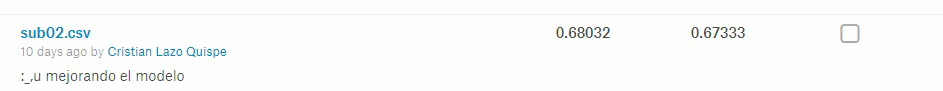

In [3]:
from PIL import Image
Image.open('2.jpg')


PUESTOS DEL CONCURSO


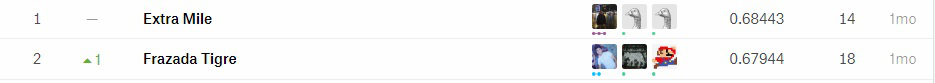

In [5]:
print('PUESTOS DEL CONCURSO')
Image.open('3.jpg')

### Se observa que con el Data Cleansing and Features Engineering se pudo mejorar tanto el modelo que 
### hubieramos podido llegar al segundo puesto superando a equipos de trayectoria mundial

# REFERENCIAS

- https://papers.nips.cc/paper/6907-lightgbm-a-highly-efficient-gradient-boosting-decision-tree.pdf
- https://www.kaggle.com/startupsci/titanic-data-science-solutions
- https://www.kaggle.com/mjbahmani/exploratory-data-analysis-pipeline
- https://www.kaggle.com/pmarcelino/comprehensive-data-exploration-with-python
